In [1]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import sqlite3
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
from shapely.ops import unary_union
from shapely.geometry.polygon import Polygon
import folium

## What is the price distribution of menu items?

In [12]:
# Create queries
query_category_del = """
SELECT
    menu_items.name AS menu_item_name, 
    ROUND(AVG(price), 2) AS AVG_price
FROM 
    menu_items
    JOIN categories ON menu_items.restaurant_id  = categories.restaurant_id
WHERE price > 0 
GROUP BY
    menu_items.name
;

"""
query_category_tak = """
SELECT
    menuItems.name AS menu_item_name, 
    ROUND(AVG(price), 2) AS AVG_price
FROM 
    menuItems
WHERE price > 0 
GROUP BY
    menuItems.name
;

"""
query_category_uber = """ 

SELECT
    menu_items.name AS menu_item_name, 
    ROUND(AVG(price/ 100), 2) AS AVG_price
FROM 
    menu_items
WHERE price > 0 
GROUP BY
    menu_items.name
;

"""



In [13]:
# Function for displaying the distribution of prices for menu items
def price_dist(data, range , c_name):
    plt.hist(data['AVG_price'], bins=50, color='skyblue', edgecolor='black')
    plt.xticks(range)
    plt.xlabel('€')
    plt.ylabel('Frequency')
    plt.title(f'Menu item Price distrubution for {c_name}')
    
    plt.show()
    
# Function for creating DF of price distribution intervals for menu items
def dist_table (data):
    bins = np.arange(0, 261, 5)
    frequencies, bin_edges = np.histogram(data['AVG_price'], bins=bins)      # frequency distribution
    distribution_table = pd.DataFrame({
        'Price Range (€)': [f'{bin_edges[i]} - {bin_edges[i+1]}' for i in range(len(bin_edges)-1)],
        'Frequency': frequencies
    })
    return distribution_table

In [14]:
takeaway_db = './Databases/takeaway.db'
deliveroo_db ='./Databases/deliveroo.db'
Uber_db ='./Databases/ubereats.db'
def query_db(db, sql_query):
    ''' input: db (path to SQLite database), sql_query (str)
        output: pandas DataFrame
    '''
    conn = sqlite3.connect(db)
    with conn:
        res = pd.read_sql_query(sql_query, conn)
    if conn:
        conn.close()
    return res

In [15]:
takeaway_df = query_db(takeaway_db, query_category_tak)
deliveroo_df = query_db(deliveroo_db, query_category_del)
deliveroo_df = deliveroo_df[(deliveroo_df["AVG_price"] > 0) & (deliveroo_df["AVG_price"] < 250)]
uber_df = query_db(Uber_db, query_category_uber)

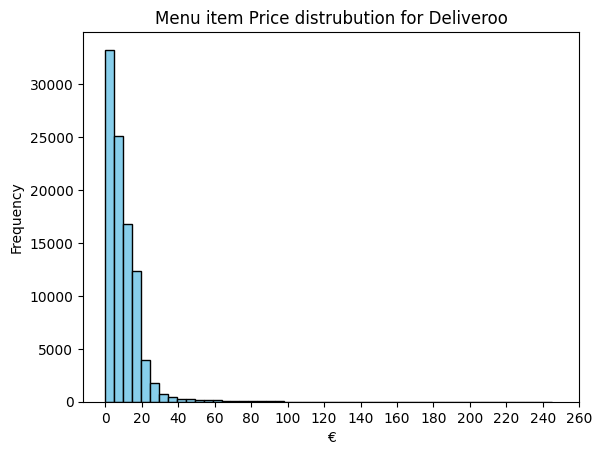

   Price Range (€)  Frequency
0            0 - 5      33793
1           5 - 10      25413
2          10 - 15      16630
3          15 - 20      12047
4          20 - 25       3776
5          25 - 30       1751
6          30 - 35        689
7          35 - 40        453
8          40 - 45        242
9          45 - 50        247
10         50 - 55        166
11         55 - 60        126
12         60 - 65        113
13         65 - 70        103
14         70 - 75         64
15         75 - 80         68
16         80 - 85         43
17         85 - 90         51
18         90 - 95         32
19        95 - 100         36
20       100 - 105         14
21       105 - 110         19
22       110 - 115         22
23       115 - 120         14
24       120 - 125          9
25       125 - 130         19
26       130 - 135          6
27       135 - 140          4
28       140 - 145          4
29       145 - 150          6
30       150 - 155         10
31       155 - 160          0
32       1

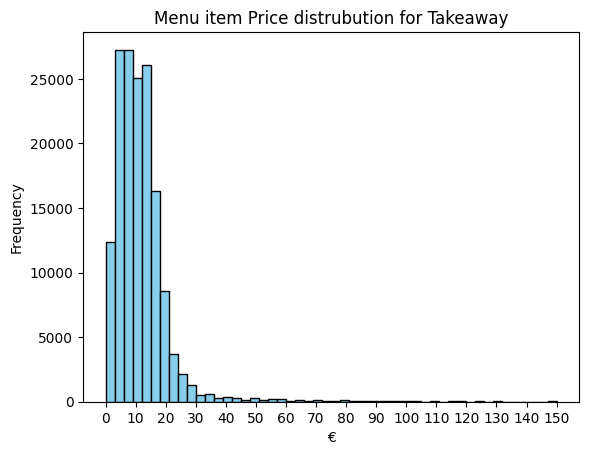

   Price Range (€)  Frequency
0            0 - 5      27582
1           5 - 10      44541
2          10 - 15      42245
3          15 - 20      25209
4          20 - 25       7439
5          25 - 30       2708
6          30 - 35       1045
7          35 - 40        792
8          40 - 45        426
9          45 - 50        408
10         50 - 55        328
11         55 - 60        271
12         60 - 65        207
13         65 - 70        200
14         70 - 75        142
15         75 - 80        146
16         80 - 85        107
17         85 - 90         81
18         90 - 95         52
19        95 - 100         88
20       100 - 105         51
21       105 - 110         36
22       110 - 115         55
23       115 - 120         38
24       120 - 125         44
25       125 - 130         32
26       130 - 135         28
27       135 - 140          9
28       140 - 145         11
29       145 - 150          6
30       150 - 155         22
31       155 - 160          0
32       1

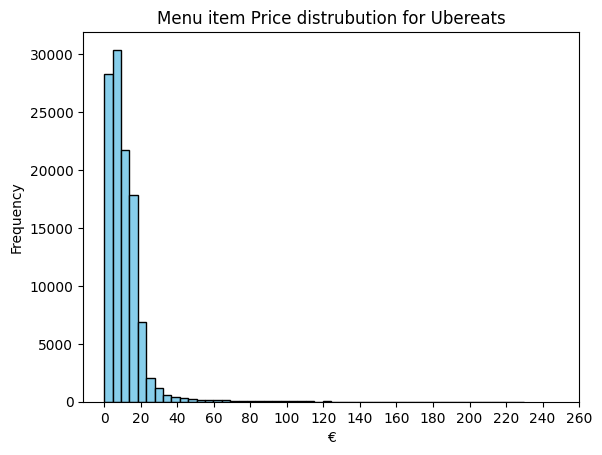

   Price Range (€)  Frequency
0            0 - 5      30320
1           5 - 10      31567
2          10 - 15      23987
3          15 - 20      15464
4          20 - 25       4610
5          25 - 30       1838
6          30 - 35        789
7          35 - 40        556
8          40 - 45        287
9          45 - 50        322
10         50 - 55        204
11         55 - 60        226
12         60 - 65        120
13         65 - 70        118
14         70 - 75         76
15         75 - 80         75
16         80 - 85         50
17         85 - 90         44
18         90 - 95         30
19        95 - 100         53
20       100 - 105         28
21       105 - 110         21
22       110 - 115         31
23       115 - 120         19
24       120 - 125         30
25       125 - 130          0
26       130 - 135          3
27       135 - 140          1
28       140 - 145          0
29       145 - 150          0
30       150 - 155          0
31       155 - 160          0
32       1

In [16]:
price_dist(deliveroo_df, range =range(0, 261, 20), c_name = "Deliveroo")
print(dist_table(deliveroo_df))
price_dist(takeaway_df, range =range(0, 151, 10), c_name = "Takeaway")
print(dist_table(takeaway_df))
price_dist(uber_df, range =range(0, 261, 20), c_name = "Ubereats")
print(dist_table(uber_df))

## What is the distribution of restaurants per location?

In [17]:
# Define function to execute queries
def execute_query(database_path, query):
    """Execute a SQL query on a given database and return the results."""
    conn = sqlite3.connect(database_path)
    cursor = conn.cursor()
    cursor.execute(query)
    results = cursor.fetchall()
    conn.close()
    return results

# Query for Deliveroo
query_deli = """
SELECT 
    postal_code AS postal_code,
    'Deliveroo' AS platform
FROM 
    restaurants
WHERE 
    postal_code LIKE '____' 
ORDER BY 
    postal_code;
"""

# Query for Takeaway
query_take = """
SELECT 
    postalCode AS postal_code,
    'Takeaway' AS platform
FROM 
    locations
WHERE 
    postal_code LIKE '____' 
ORDER BY 
    postalCode; 
"""

# Query for UberEats
query_uber = """
SELECT 
    region AS postal_code,
    'Ubereats' AS platform
FROM 
    locations
WHERE 
    region LIKE '____'  
ORDER BY 
    region; 
"""

# Execute queries and get results
results_deli = execute_query("./Databases/deliveroo.db", query_deli)
results_take = execute_query("./Databases/takeaway.db", query_take)
results_uber = execute_query("./Databases/ubereats.db", query_uber)

# Combine results into one list and create a DataFrame
combined_results = results_deli + results_take + results_uber
columns = ['Postal Code', 'Platform']
df = pd.DataFrame(combined_results, columns=columns)
# Convert Postal Code to integer
df['Postal Code'] = df['Postal Code'].astype(int)

# Display the result
print(df)




      Postal Code   Platform
0            1000  Deliveroo
1            1000  Deliveroo
2            1000  Deliveroo
3            1000  Deliveroo
4            1000  Deliveroo
...           ...        ...
7715         9990   Ubereats
7716         9990   Ubereats
7717         9990   Ubereats
7718         9991   Ubereats
7719         9992   Ubereats

[7720 rows x 2 columns]


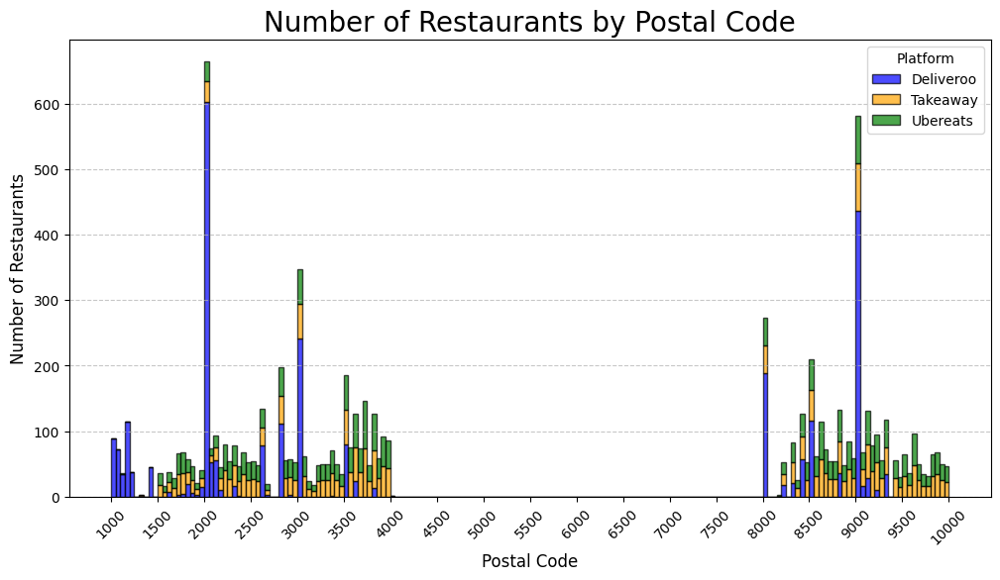

In [18]:
# Create a figure
plt.figure(figsize=(12, 6))

# Define the bin edges
bins = range(1000, 10001, 50)  # Postal codes between 1000 and 10000, in steps of 50

# Prepare data for stacked histogram
platforms = df['Platform'].unique()
colors = {'Deliveroo': 'blue', 'Takeaway': 'orange', 'Ubereats': 'green'}  # Define colors for each platform

# Prepare a list of postal code arrays for each platform
data = [df[df['Platform'] == platform]['Postal Code'] for platform in platforms]

# Plot stacked histogram
plt.hist(data, bins=bins, alpha=0.7, label=platforms, edgecolor='black', color=[colors[platform] for platform in platforms], stacked=True)

# Add labels, title, and legend
plt.title('Number of Restaurants by Postal Code', fontsize=20)
plt.xlabel('Postal Code', fontsize=12)
plt.ylabel('Number of Restaurants', fontsize=12)
plt.xticks(ticks=range(1000, 10001, 500), rotation=45)  # Tick positions every 500
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(title='Platform')

# Show the plot
plt.show()

## Which are the top 10 pizza restaurants by rating?

In [19]:
def deliveroo():
    connexion = sqlite3.connect("Databases/deliveroo.db")
    cursor = connexion.cursor()

    for row in cursor.execute("""

        SELECT
            restaurants.name, restaurants.rating
        FROM
            restaurants
            JOIN categories on restaurants.id = categories.restaurant_id
        WHERE
            categories.name = "Pizza"
        ORDER BY
            restaurants.rating DESC
        LIMIT 10;
    """):
        print(row[0], row[1])

# UberEats
def uber_eats():
    connexion = sqlite3.connect("Databases/ubereats.db")
    cursor = connexion.cursor()

    for row in cursor.execute("""

        SELECT
            restaurants.title, restaurants.rating__rating_value
        FROM
            restaurants
            JOIN restaurant_to_categories on restaurants.id = restaurant_to_categories.restaurant_id
        WHERE
            restaurant_to_categories.category = "Pizza"
        ORDER BY
            restaurants.rating__rating_value DESC
        LIMIT 10;
    """):
        print(row[0], row[1])

# UberEats
def takeaway():
    connexion = sqlite3.connect("Databases/takeaway.db")
    cursor = connexion.cursor()

    for row in cursor.execute("""
        SELECT
            restaurants.name, restaurants.ratings
        FROM
            restaurants
            JOIN categories_restaurants on restaurants.primarySlug = categories_restaurants.restaurant_id
        WHERE
            categories_restaurants.category_id = "italian-pizza_271"
        ORDER BY
            restaurants.ratings DESC
        LIMIT 10;
    """):
        print(row[0], row[1])

print('Deliveroo: ')
deliveroo()
print('')
print('Uber Eats: ')
uber_eats()
print('')
print('Takeaway: ')
takeaway()


Deliveroo: 
Trattoria Murano 4.8
Place 2 Eat 4.7
Pretzel King 4.6
Piano A apulian pizza 4.5
Tutti Atelier 4.5
Pasta Commedia 4.4
Napoli Da Leonardo 4.4
Orso Pizzeria 4.4
PIZZERIA ROSSI 4.4
Pizarro Antwerpen 4.4

Uber Eats: 
American pizza 4.9
Detroit Square Pizza 4.8
Pizarro 4.8
Kalura 4.7
Pita Amon 4.7
Pizzeria Margarita 4.7
Pizza Florence 4.6
Pizza Pasta Nr 1 - City 4.6
Diamond Pizza Merksem 4.6
Pizzeria Saporito 4.6

Takeaway: 
De Echte Eethuis Carlos 5
Kebap - Pizza De Brug 5
Munchies Ieper 5
Pastalia 5
Trend Kebab & Pizzeria 5
Am Princesse 4.9
Barnaba 4.9
Baskent Meerhout 4.9
De Notenboom 4.9
Detroit Square Pizza 4.9


## Map locations offering kapsalons and their average price.

In [4]:
takeaway_db = './Databases/takeaway.db'
deliveroo_db ='./Databases/deliveroo.db'
ubereats_db ='./Databases/ubereats.db'

def query_db(query, db):
    conn = sqlite3.connect(db)
    with conn:
        res = pd.read_sql_query(query, conn)
    if conn:
        conn.close()
    return res

In [7]:
# Create the query for deliveroo

query = """
    SELECT restaurants.name as name, ROUND(AVG(menu_items.price), 2) as avg_price, restaurants.address as address,
    restaurants.latitude as latitude, restaurants.longitude as longitude
    FROM menu_items
    JOIN restaurants ON restaurants.id = menu_items.restaurant_id
    WHERE menu_items.name LIKE "%kapsalon%"
    GROUP BY restaurants.name;
"""

data_deliveroo = query_db(query, deliveroo_db)

In [8]:
geo_data_deliveroo = gpd.GeoDataFrame(data_deliveroo, geometry=gpd.points_from_xy(data_deliveroo.longitude, data_deliveroo.latitude), crs="EPSG:4326")

In [10]:
m = folium.Map(location=[50.851409, 4.350694], zoom_start=8) 

for _, row in geo_data_deliveroo.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"Name: {row['name']}<br>Price (avg): €{row['avg_price']}<br>Address: {row['address']}",
    ).add_to(m)

m.save("./maps/deliveroo_kapsalons_map.html")

In [11]:
m

In [12]:
# Create the query for TakeAway
query = """
    SELECT restaurants.primarySlug as name, ROUND(AVG(menuItems.price), 2) as avg_price, restaurants.address,
    restaurants.latitude as latitude, restaurants.longitude as longitude
    FROM menuItems
    JOIN restaurants ON restaurants.primarySlug = menuItems.primarySlug
    WHERE menuItems.name LIKE "%kapsalon%"
    GROUP BY restaurants.primarySlug;
"""

data_takeaway = query_db(query, takeaway_db)

In [13]:
geo_data_takeaway = gpd.GeoDataFrame(data_takeaway, geometry=gpd.points_from_xy(data_takeaway.longitude, data_takeaway.latitude), crs="EPSG:4326")

In [14]:
m = folium.Map(location=[50.851409, 4.350694], zoom_start=8) 

for _, row in geo_data_takeaway.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"Name: {row['name']}<br>Price (avg): €{row['avg_price']}<br>Address: {row['address']}",
    ).add_to(m)

m.save("./maps/takeaway_kapsalons_map.html")

In [15]:
m

In [ ]:
# Create the query for UberEats
query = """
    SELECT restaurants.sanitized_title as name, ROUND(AVG(menu_items.price / 100), 2) as avg_price, restaurants.location__address as address,
    restaurants.location__latitude as latitude, restaurants.location__longitude as longitude
    FROM menu_items
    JOIN restaurants ON restaurants.id = menu_items.restaurant_id
    WHERE menu_items.name LIKE "%kapsalon%"
    GROUP BY restaurants.sanitized_title;
"""

data_ubereats = query_db(query, ubereats_db)

In [17]:
# Create and show the map for UberEats
geo_data_ubereats = gpd.GeoDataFrame(data_ubereats, geometry=gpd.points_from_xy(data_ubereats.longitude, data_ubereats.latitude), crs="EPSG:4326")

In [19]:
m = folium.Map(location=[50.851409, 4.350694], zoom_start=8) 

for _, row in geo_data_ubereats.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"Name: {row['name']}<br>Price (avg): €{row['avg_price']}<br>Address: {row['address']}",
    ).add_to(m)

m.save("./maps/ubereats_kapsalons_map.html")

In [20]:
m

## Where are the delivery ‘dead zones’—areas with minimal restaurant coverage?

In [38]:
# Function to create and save a map with delivery zones
def restos_to_density_map(df, filename):
    try:
        geometry = [Point(xy) for xy in zip(df['longitude'], df['latitude'])]
        gdf = gpd.GeoDataFrame(df, geometry=geometry, crs="EPSG:4326")

        min_lat, max_lat = 50.704501, 51.508238
        min_lon, max_lon = 2.541120, 5.853457

        boundary_coords = [(min_lon, max_lat), (max_lon, max_lat), (max_lon, min_lat), (min_lon, min_lat)]
        boundary = Polygon(boundary_coords)

        coverage_radius = 0.15
        gdf['buffer'] = gdf.geometry.buffer(coverage_radius)

        covered_area = unary_union(gdf['buffer'])
        dead_zones = boundary.difference(covered_area)
        
        pop_data = gpd.read_file("Zelim/TF_POPULATION_GRID_3035_20200101.geojson")
        pop_data = pop_data.to_crs("EPSG:4326")

        m = folium.Map(location=[50.851409, 4.350694], zoom_start=8)

        for idx, row in df.iterrows():
            folium.CircleMarker(
                location=[row['latitude'], row['longitude']],
                radius=1,
                color='black',
                fill=True,
                fill_color='black',
                fill_opacity=1,
            ).add_to(m)

        folium.GeoJson(
            dead_zones,
            style_function=lambda x: {'color': '#595959', 'fillOpacity': 0.3}
        ).add_to(m)

        folium.GeoJson(
            pop_data,
            style_function=lambda feature: {
                'fillColor': '#ff6600' if feature['properties']['ms_population_20200101'] > 1000 else '#ffff00',
                'color': '#000000',
                'weight': 0.5,
                'fillOpacity': 0.3,
            },
            tooltip=folium.GeoJsonTooltip(
                fields=['ms_population_20200101'],
                aliases=['Population'],
                localize=True
            )
        ).add_to(m)

        m.save(f"./maps/{filename}.html")        
    except:
        return Exception

In [39]:
# Query for deliveroo
query = """
    SELECT latitude, longitude
    FROM restaurants;
"""

data_deliveroo = query_db(query, deliveroo_db)
data_deliveroo.astype(float)

,latitude,longitude
0,50.855476,4.399550
1,50.794531,4.334645
2,50.792346,4.352460
3,50.792341,4.351862
4,50.848879,4.433540
...,...,...
2711,51.205810,4.470221
2712,50.879296,4.706208
2713,51.169475,4.137958
2714,51.219129,4.419331


In [41]:
# Create map for deliveroo
restos_to_density_map(data_deliveroo, "combined_deliveroo_restos_population_density_map")

C:\Users\nicol\AppData\Local\Temp\ipykernel_7104\3228815487.py:14: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['buffer'] = gdf.geometry.buffer(coverage_radius)


In [42]:
# Query for Takeaway
query = """
    SELECT latitude, longitude
    FROM restaurants
    WHERE latitude > 0;
"""

data_takeaway = query_db(query, takeaway_db)
data_takeaway.astype(float)

,latitude,longitude
0,50.743630,3.216888
1,50.540992,5.460752
2,50.675491,5.480206
3,50.684180,5.549703
4,50.663340,5.512421
...,...,...
4048,50.805719,3.872587
4049,50.870853,4.018145
4050,50.836477,4.026344
4051,50.762280,3.862852


In [ ]:
# Create and save a map for Takeaway
restos_to_density_map(data_takeaway, "combined_takeaway_restos_population_density_map")


C:\Users\nicol\AppData\Local\Temp\ipykernel_7104\3228815487.py:14: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['buffer'] = gdf.geometry.buffer(coverage_radius)


In [44]:
# Query for UberEats
query = """
    SELECT location__latitude as latitude, location__longitude as longitude
    FROM restaurants;
"""

data_ubereats = query_db(query, ubereats_db)
data_ubereats.astype(float)

,latitude,longitude
0,51.056860,3.737415
1,51.188560,4.425970
2,50.928600,4.422260
3,51.197890,4.425630
4,51.240870,4.439240
...,...,...
2724,50.878698,4.700045
2725,50.839031,4.285931
2726,50.717330,4.396220
2727,51.205427,4.472862


In [ ]:
# Createand save a  map for UberEats
restos_to_density_map(data_ubereats, "combined_ubereats_restos_population_density_map")

C:\Users\nicol\AppData\Local\Temp\ipykernel_7104\3228815487.py:14: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['buffer'] = gdf.geometry.buffer(coverage_radius)


In [ ]:
# Create and save a combined map
df = pd.concat([data_deliveroo, data_takeaway, data_ubereats], axis=0, ignore_index=True)
restos_to_density_map(df, "combined_all_restos_population_density_map")

C:\Users\nicol\AppData\Local\Temp\ipykernel_7104\3228815487.py:14: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['buffer'] = gdf.geometry.buffer(coverage_radius)


## How do delivery fees vary across platforms and locations?

In [47]:
%load_ext autoreload
%autoreload 2

In [55]:
from Wouter.delivery_fees import create_df, heatmap, get_map, modify_to_geo, find_polygon

In [60]:
sql_code_deliveroo = """
        SELECT
            restaurants.postal_code,
            AVG(restaurants.delivery_fee) AS fee
        FROM
            restaurants
        GROUP BY
            postal_code;
        """
deliveroo_db = create_df("./Databases/deliveroo.db", "Deliveroo", sql_code_deliveroo)

deliveroo_db = modify_to_geo(deliveroo_db)

deliveroo_db

Deliveroo: 


,postal_code,fee,geometry
1,1000,4.990000,"POLYGON ((4.35719 50.86031, 4.35668 50.85935, ..."
2,1000,4.990000,"POLYGON ((4.36046 50.90118, 4.35731 50.90137, ..."
3,1000,4.990000,"MULTIPOLYGON (((4.36812 50.81486, 4.37067 50.8..."
4,1020,4.414231,"POLYGON ((4.36046 50.90118, 4.35731 50.90137, ..."
5,1030,4.990000,"POLYGON ((4.41172 50.85211, 4.41071 50.85302, ..."
...,...,...,...
90,9070,4.990000,"POLYGON ((3.82972 50.99369, 3.8307 50.9934, 3...."
91,9100,4.990000,"POLYGON ((4.15385 51.13523, 4.15586 51.13599, ..."
92,9200,4.990000,"POLYGON ((4.04773 51.04259, 4.0492 51.04183, 4..."
93,9300,4.799412,"POLYGON ((3.9988 50.93797, 3.99917 50.93753, 4..."


In [61]:
get_map(deliveroo_db, "fee", "Fee compared geographically", bins=8, map_title="Deliveroo delivery fees")

In [63]:
sql_code_takeaway = """
        SELECT
            locations.postalCode,
            AVG(restaurants.deliveryFee) AS fee
        FROM
            locations_to_restaurants
            JOIN restaurants on restaurants.primarySlug = locations_to_restaurants.restaurant_id
            JOIN locations on locations.ID = locations_to_restaurants.location_id
        GROUP BY
            locations.postalCode
        """
takeaway_db = create_df("./Databases/takeaway.db", "TakeAway", sql_code_takeaway)

takeaway_db = modify_to_geo(takeaway_db)

takeaway_db

TakeAway: 


,postal_code,fee,geometry
0,1140,3.597537,"POLYGON ((4.42664 50.86286, 4.42541 50.86386, ..."
1,1320,1.812500,"POLYGON ((4.78911 50.7579, 4.79042 50.75808, 4..."
2,1500,3.123929,"POLYGON ((4.30796 50.70022, 4.30981 50.70168, ..."
3,1501,3.274598,"POLYGON ((4.25515 50.75213, 4.25318 50.75014, ..."
4,1502,2.976957,"POLYGON ((4.18188 50.70692, 4.18205 50.70666, ..."
...,...,...,...
522,9982,1.000000,"POLYGON ((3.60774 51.26511, 3.60682 51.26483, ..."
523,9988,0.000000,"POLYGON ((3.68699 51.28083, 3.68257 51.28109, ..."
524,9990,2.123750,"POLYGON ((3.49055 51.15275, 3.48799 51.15384, ..."
525,9991,2.776667,"POLYGON ((3.54506 51.16228, 3.53903 51.17188, ..."


In [64]:
get_map(takeaway_db, "fee", "Fee compared geographically", bins=8, map_title="TakeAway delivery fees")

In [65]:
# There is no data on delivery fees of Uber Eats

# Let's now try and find the average of both Deliveroo and TakeAway:

full_df = pd.merge(takeaway_db, deliveroo_db, left_on=["postal_code"], right_on=["postal_code"], how="outer")
full_df['average_fee'] = full_df[['fee_x', 'fee_y']].mean(axis=1)
average_db_small = full_df[['postal_code', 'average_fee']]
polygons = find_polygon()

average_db = pd.merge(average_db_small, polygons, left_on=["postal_code"], right_on=["postal_code"], how="left")

average_db

,postal_code,average_fee,geometry
0,1000,4.990000,"POLYGON ((4.35719 50.86031, 4.35668 50.85935, ..."
1,1000,4.990000,"POLYGON ((4.36046 50.90118, 4.35731 50.90137, ..."
2,1000,4.990000,"MULTIPOLYGON (((4.36812 50.81486, 4.37067 50.8..."
3,1000,4.990000,"POLYGON ((4.35719 50.86031, 4.35668 50.85935, ..."
4,1000,4.990000,"POLYGON ((4.36046 50.90118, 4.35731 50.90137, ..."
...,...,...,...
585,9982,1.000000,"POLYGON ((3.60774 51.26511, 3.60682 51.26483, ..."
586,9988,0.000000,"POLYGON ((3.68699 51.28083, 3.68257 51.28109, ..."
587,9990,2.123750,"POLYGON ((3.49055 51.15275, 3.48799 51.15384, ..."
588,9991,2.776667,"POLYGON ((3.54506 51.16228, 3.53903 51.17188, ..."


In [66]:
get_map(average_db, "average_fee", "Fee compared geographically", bins=8, map_title="Average delivery fees")

## Which restaurants have the best price-to-rating ratio?

In [68]:
# Define function to execute queries
def execute_query(database_path, query):
    """Execute a SQL query on a given database and return the results."""
    conn = sqlite3.connect(database_path)
    cursor = conn.cursor()
    cursor.execute(query)
    results = cursor.fetchall()
    conn.close()
    return results

# Query for Deliveroo
query_deli = """
SELECT 
    restaurants.name, 
    restaurants.rating, 
    AVG(menu_items.price) AS avg_price,  
    ROUND(AVG(menu_items.price) / restaurants.rating, 2) AS price_to_rating_ratio,
    'Deliveroo'
FROM 
    restaurants
INNER JOIN 
    menu_items 
ON 
    restaurants.id = menu_items.restaurant_id
WHERE 
    restaurants.rating > 0.1 
GROUP BY 
    restaurants.id
HAVING 
    AVG(menu_items.price) > 10  -- Filter by average price > 10 to filter out sandwich shops and strage values
ORDER BY 
    price_to_rating_ratio ASC;  
"""

# Query for Takeaway
query_take = """
SELECT 
    restaurants.name,
    restaurants.ratings,
    AVG(menuItems.price) AS avg_price,
    ROUND(AVG(menuItems.price) / restaurants.ratings, 2) AS price_to_rating_ratio,
    'Takeaway' 
FROM 
    restaurants
INNER JOIN 
    menuItems 
ON 
    restaurants.primarySlug = menuItems.primarySlug
WHERE 
    restaurants.ratings > 0.1 
GROUP BY 
    menuItems.primarySlug
HAVING 
    AVG(menuItems.price) > 10   -- Filter by average price > 10 to filter out sandwich shops and strage values
ORDER BY 
    price_to_rating_ratio ASC;  
"""

# Query for UberEats
query_uber = """
SELECT 
    restaurants.title,
    restaurants.rating__rating_value,
    AVG(menu_items.price) / 100 AS avg_price,   -- menu_items.price is in eurocent
    ROUND(AVG(menu_items.price) / 100 / restaurants.rating__rating_value, 2) AS price_to_rating_ratio,
    'Ubereats' 
FROM restaurants
INNER JOIN 
    menu_items 
ON 
    restaurants.id = menu_items.restaurant_id
WHERE 
    restaurants.rating__rating_value > 0.1 
GROUP BY 
    menu_items.restaurant_id
HAVING 
    AVG(menu_items.price) / 100 > 10     -- menu_items.price is in eurocent. Filter by average price > 10 to filter out sandwich shops and strage values
ORDER BY 
    price_to_rating_ratio ASC; 
"""

# Execute queries and get results
results_deli = execute_query("./Databases/deliveroo.db", query_deli)
results_take = execute_query("./Databases/takeaway.db", query_take)
results_uber = execute_query("./Databases/ubereats.db", query_uber)

# Combine results into one list and create a DataFrame
combined_results = results_deli + results_take + results_uber
columns = ['Restaurant Name', 'Rating', 'Avg Price', 'Price-to-Rating Ratio', 'Platform']
df = pd.DataFrame(combined_results, columns=columns)

# Sort by Price-to-Rating Ratio
df = df.sort_values(by='Price-to-Rating Ratio', ascending=True)


# Display the result
print(df)




               Restaurant Name  Rating  Avg Price  Price-to-Rating Ratio  \
459                       Bite     4.9  10.215789                   2.08   
461          Le Pain Quotidien     4.8  10.042808                   2.09   
462                   Mozaique     4.8  10.046269                   2.09   
460             Restaurant Gok     4.8  10.041667                   2.09   
463             Pizzeria Tiamo     4.8  10.096471                   2.10   
...                        ...     ...        ...                    ...   
2080  Japans Restaurant Amatsu     4.4  38.469697                   8.74   
456                Lobster Pot     4.1  35.958333                   8.77   
2081        Pizza Hut Delivery     1.9  17.344944                   9.13   
457            Neuhaus Hasselt     4.2  44.307692                  10.55   
458         Ottoman grillhouse     4.2  52.953704                  12.61   

       Platform  
459    Takeaway  
461    Takeaway  
462    Takeaway  
460    Takeaway

## How does the availability of vegetarian and vegan dishes vary by area?

In [71]:
where_clause  = """
WHERE
(m.name LIKE '%Vegi%' OR m.name LIKE '%Veg%' 
    OR m.name LIKE '%Vleesvrij%' 
    OR m.name LIKE '%Plantaardig%' 
    OR m.name LIKE '%Groen%' 
    OR m.name LIKE '%Duurzaam%' 
    OR m.description LIKE '%veg%'  
    OR m.description LIKE '%vleesvrij%' 
    OR m.description LIKE '%plantaardig%' 
    OR m.description LIKE '%groen%' 
    OR m.description LIKE '%duurzaam%'
    OR LOWER(m.name) LIKE '%veg%' 
    OR LOWER(m.name) LIKE '%meat-free%' 
    OR LOWER(m.name) LIKE '%plant-based%' 
    OR LOWER(m.name) LIKE '%green%' 
    OR LOWER(m.name) LIKE '%sustainable%' 
    OR LOWER(m.description) LIKE '%meat-free%' 
    OR LOWER(m.description) LIKE '%plant-based%' 
    OR LOWER(m.description) LIKE '%green%' 
    OR LOWER(m.description) LIKE '%sustainable%'
    OR LOWER(m.name) LIKE '%végé%' 
    OR LOWER(m.name) LIKE '%sans viande%' 
    OR LOWER(m.name) LIKE '%à base de plantes%' 
    OR LOWER(m.name) LIKE '%vert%' 
    OR LOWER(m.name) LIKE '%durable%')
"""

In [72]:
query_vegi_d = f"""   
SELECT 
    m.name AS dish_name,
    m.restaurant_id,
    r.name AS restaurant_name,
    latitude,
    longitude,
    postal_code,
    address
FROM 
    menu_items AS m
    JOIN restaurants AS r  ON m.restaurant_id = r.id
    
{where_clause} 

GROUp BY
    restaurant_id
;

"""

In [73]:
query_vegi_T = f"""   
SELECT 
    m.name AS dish_name,
    r.name AS restaurant_name,
    latitude,
    longitude,
    address,
    city
FROM 
    menuItems AS m
    JOIN restaurants AS r  ON m.primarySlug	 = r.primarySlug
{where_clause}
    AND r.latitude != 0
    AND r.longitude != 0 
GROUp BY
    restaurant_name

;

"""

In [74]:
query_vegi_U = f"""   
SELECT 
    m.name AS Item_name,
    location__address AS address,
    location__city AS city,
    location__latitude AS latitude,
    location__longitude AS longitude,
    title AS resturant_name
    
FROM 
    menu_items AS m
    JOIN restaurants AS r ON m.restaurant_id = r.id
{where_clause}
    AND r.location__latitude != 0
    AND r.location__longitude != 0 
GROUP BY
    title
;

"""

In [75]:
takeaway_db = './Databases/takeaway.db'
deliveroo_db ='./Databases/deliveroo.db'
Uber_db ='./Databases/ubereats.db'
def query_db(db, sql_query):
    ''' input: db (path to SQLite database), sql_query (str)
        output: pandas DataFrame
    '''
    conn = sqlite3.connect(db)
    with conn:
        res = pd.read_sql_query(sql_query, conn)
    if conn:
        conn.close()
    return res

In [76]:
takeaway_df = query_db(takeaway_db, query_vegi_T)
deliveroo_df = query_db(deliveroo_db, query_vegi_d)
uber_df = query_db(Uber_db, query_vegi_U)

In [77]:
# Deliveroo dataset
deliveroo_df = deliveroo_df[['restaurant_name', 'address', 'latitude', 'longitude']]
deliveroo_df.rename(columns={'restaurant_name': 'Name'}, inplace=True)
deliveroo_geometry = gpd.points_from_xy(deliveroo_df.longitude, deliveroo_df.latitude)
deliveroo_gdf = gpd.GeoDataFrame(deliveroo_df, crs='EPSG:4326', geometry=deliveroo_geometry)

# Takeaway dataset
takeaway_df = takeaway_df[['restaurant_name', 'address', 'city', 'latitude', 'longitude']]
takeaway_df.rename(columns={'restaurant_name': 'Name'}, inplace=True)
takeaway_geometry = gpd.points_from_xy(takeaway_df.longitude, takeaway_df.latitude)
takeaway_gdf = gpd.GeoDataFrame(takeaway_df, crs='EPSG:4326', geometry=takeaway_geometry)

# Uber Eats dataset
ubereats_df = uber_df[['resturant_name','address','city', 'latitude', 'longitude']]
ubereats_df.rename(columns={'resturant_name': 'Name'}, inplace=True)
ubereats_geometry = gpd.points_from_xy(ubereats_df.longitude, ubereats_df.latitude)
ubereats_gdf = gpd.GeoDataFrame(ubereats_df, crs='EPSG:4326', geometry=ubereats_geometry)

# Creating a Folium map
m = folium.Map(location=[50.85, 4.35], zoom_start=10,  control_scale = True) 

# Adding Takeaway points to the map
for _, row in takeaway_gdf.iterrows():   # _ means "ignore the index, I don't need it." it is a way to save the index (first var) without using it later
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius= 10,  # Marker size
        popup=f"Takeaway<br>Name: {row['Name']}<br>Address: {row['address']}",
        color='orange',  #
        fill=True,
        fill_color='orange',  # Fill color
        fill_opacity=1
    ).add_to(m)

# Adding Uber Eats points to the map
for _, row in ubereats_gdf.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,  #
        popup=f"Uber Eats<br>Name: {row['Name']}<br>Address: {row['address']}",
        color='black',  # 
        fill=True,
        fill_color='black',  # Fill color
        fill_opacity=0.6
    ).add_to(m)
# Adding Deliveroo points to the map 
for _, row in deliveroo_gdf.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=2,  # Marker size
        popup=f"Deliveroo<br>Name: {row['Name']}<br>Address: {row['address']}",
        color='lightblue',  # Border color
        fill=True,
        fill_color='lightblue',  # Fill color
        fill_opacity=0.2
    ).add_to(m)
    
m.save("./maps/Veg_map.html")




C:\Users\nicol\AppData\Local\Temp\ipykernel_7104\1174408140.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ubereats_df.rename(columns={'resturant_name': 'Name'}, inplace=True)


## How do ratings of similar restaurants differ across Uber Eats, Deliveroo, and Takeaway?


In [79]:
# Define function to fetch data from each database
def fetch_data(database_path, query):
    conn = sqlite3.connect(database_path)
    cursor = conn.cursor()
    cursor.execute(query)
    results = cursor.fetchall()
    conn.close()
    return results

# Queries for each database
query_deliveroo = """
SELECT 
    category,
    ROUND(AVG(rating), 2) as average_rating,
    'Deliveroo' AS source
FROM 
    restaurants
WHERE 
    category IN ('Italian', 'Burgers', 'Sushi', 'Turkish', 'Thai')
GROUP BY category;
"""

query_takeaway = """
SELECT 
    CASE
        WHEN categories_restaurants.category_id = 'italian-pizza_271' THEN 'Italian'
        WHEN categories_restaurants.category_id = 'pasta_1614' THEN 'Italian'
        WHEN categories_restaurants.category_id = 'burgers_1984' THEN 'Burgers'
        WHEN categories_restaurants.category_id = 'curry_731,' THEN 'Thai'
        WHEN categories_restaurants.category_id = 'thai_61' THEN 'Thai'
        WHEN categories_restaurants.category_id = 'pita-kebab_651' THEN 'Turkish'
        WHEN categories_restaurants.category_id = 'shoarma_2014' THEN 'Turkish'
        WHEN categories_restaurants.category_id = 'sushi_51' THEN 'Sushi'
        WHEN categories_restaurants.category_id = 'japanene_551' THEN 'Sushi'
        WHEN categories_restaurants.category_id = 'turkish-pizza' THEN 'Turkish'
        WHEN categories_restaurants.category_id = 'turkish_511' THEN 'Turkish'
        ELSE categories_restaurants.category_id
    END AS category,
    ROUND(AVG(restaurants.ratings), 2) AS average_rating,
    'Takeaway' AS source
FROM 
    categories_restaurants
INNER JOIN  
    restaurants
ON
    categories_restaurants.restaurant_id = restaurants.primarySlug
WHERE 
    category IN ('Italian', 'Burgers', 'Sushi', 'Turkish', 'Thai')
GROUP BY 
    category
ORDER BY 
    COUNT(categories_restaurants.category_id) DESC;
"""

query_ubereats = """
SELECT 
    CASE
        WHEN restaurant_to_categories.category = 'Kebab' THEN 'Turkish'
        WHEN restaurant_to_categories.category = 'Turks' THEN 'Turkish'
        WHEN restaurant_to_categories.category = 'Turque' THEN 'Turkish'        
        WHEN restaurant_to_categories.category = 'Japans' THEN 'Sushi'
        WHEN restaurant_to_categories.category = 'Japonaise' THEN 'Sushi'
        WHEN restaurant_to_categories.category = 'Pizza' THEN 'Italian'
        WHEN restaurant_to_categories.category = 'Pizzas' THEN 'Italian'
        WHEN restaurant_to_categories.category = 'Italiaans' THEN 'Italian'
        WHEN restaurant_to_categories.category = 'Italienne' THEN 'Italian'
        WHEN restaurant_to_categories.category = 'Pasta' THEN 'Italian'
        WHEN restaurant_to_categories.category = 'Hamburgers' THEN 'Burgers'
        WHEN restaurant_to_categories.category = 'Amerikaans' THEN 'Burgers'
        WHEN restaurant_to_categories.category = 'AmÃ©ricain' THEN 'Burgers'
        WHEN restaurant_to_categories.category = 'curry_731,' THEN 'Thai'
        WHEN restaurant_to_categories.category = 'Thais' THEN 'Thai'
        ELSE restaurant_to_categories.category
    END AS category,
    ROUND(AVG(restaurants.rating__rating_value), 2) AS average_rating,
    'Ubereats' AS source 
FROM restaurant_to_categories
INNER JOIN 
    restaurants 
ON 
    restaurants.id = restaurant_to_categories.restaurant_id
WHERE 
    restaurant_to_categories.category IN ('Kebab', 'Turks', 'Turque', 'Japans', 'Japonaise', 'Pizza', 'Pizzas', 'Italiaans', 'Italienne', 'Pasta', 'Hamburgers', 'Amerikaans', 'AmÃ©ricain', 'curry_731,', 'Thais')
GROUP BY 
    CASE
        WHEN restaurant_to_categories.category = 'Kebab' THEN 'Turkish'
        WHEN restaurant_to_categories.category = 'Turks' THEN 'Turkish'
        WHEN restaurant_to_categories.category = 'Turque' THEN 'Turkish'        
        WHEN restaurant_to_categories.category = 'Japans' THEN 'Sushi'
        WHEN restaurant_to_categories.category = 'Japonaise' THEN 'Sushi'
        WHEN restaurant_to_categories.category = 'Pizza' THEN 'Italian'
        WHEN restaurant_to_categories.category = 'Pizzas' THEN 'Italian'
        WHEN restaurant_to_categories.category = 'Italiaans' THEN 'Italian'
        WHEN restaurant_to_categories.category = 'Italienne' THEN 'Italian'
        WHEN restaurant_to_categories.category = 'Pasta' THEN 'Italian'
        WHEN restaurant_to_categories.category = 'Hamburgers' THEN 'Burgers'
        WHEN restaurant_to_categories.category = 'Amerikaans' THEN 'Burgers'
        WHEN restaurant_to_categories.category = 'AmÃ©ricain' THEN 'Burgers'
        WHEN restaurant_to_categories.category = 'curry_731,' THEN 'Thai'
        WHEN restaurant_to_categories.category = 'Thais' THEN 'Thai'
        ELSE restaurant_to_categories.category
    END;
"""

# Fetch data from each database
deliveroo_data = fetch_data("./Databases/deliveroo.db", query_deliveroo)
takeaway_data = fetch_data("./Databases/takeaway.db", query_takeaway)
ubereats_data = fetch_data("./Databases/ubereats.db", query_ubereats)

# Combine data using pandas
all_data = deliveroo_data + takeaway_data + ubereats_data
columns = ['Category', 'Average rating', 'Platform']
df = pd.DataFrame(all_data, columns=columns)

# Calculate average ratings by category and source
df_result = df.groupby(['Category', 'Platform']).agg({'Average rating': 'mean'}).reset_index()
df_result['Average rating'] = df_result['Average rating'].round(2)

# Display the result
print(df_result)


   Category   Platform  Average rating
0   Burgers  Deliveroo            2.75
1   Burgers   Takeaway            3.64
2   Burgers   Ubereats            4.19
3   Italian  Deliveroo            2.90
4   Italian   Takeaway            3.78
5   Italian   Ubereats            4.26
6     Sushi  Deliveroo            2.70
7     Sushi   Takeaway            4.01
8     Sushi   Ubereats            4.40
9      Thai  Deliveroo            3.04
10     Thai   Takeaway            4.02
11     Thai   Ubereats            4.39
12  Turkish  Deliveroo            3.01
13  Turkish   Takeaway            3.86
14  Turkish   Ubereats            4.23


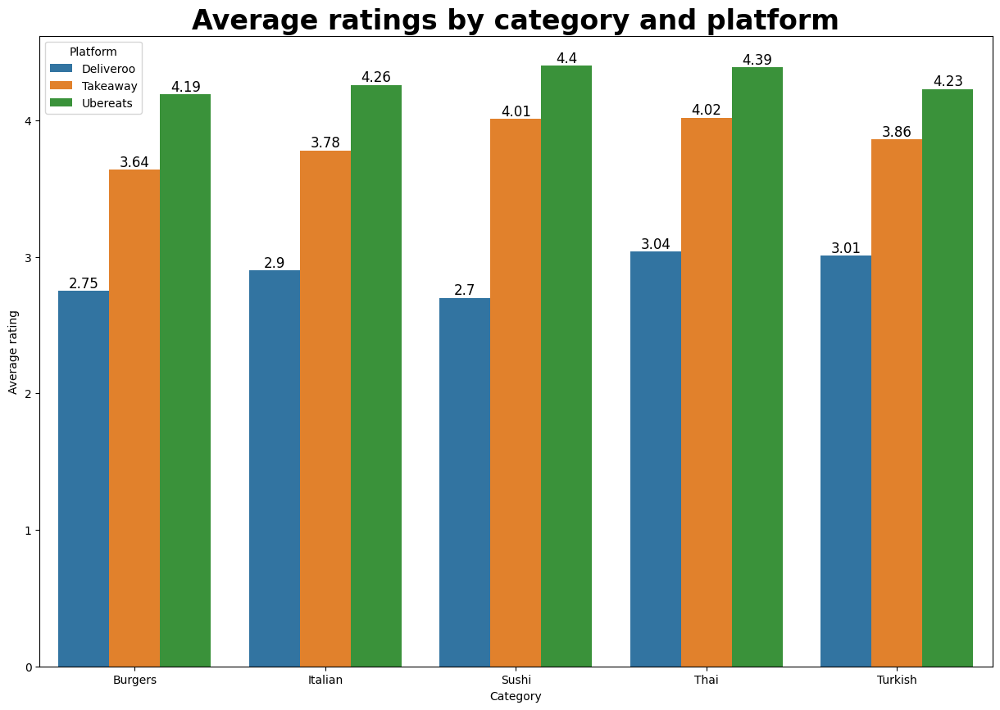

In [80]:
# Plot
plt.figure(figsize=(15, 10))
plot = sns.barplot(data=df_result, x="Category", y="Average rating", hue="Platform")
plot.bar_label(plot.containers[0], fontsize=12)
plot.bar_label(plot.containers[1], fontsize=12)
plot.bar_label(plot.containers[2], fontsize=12)
plt.title("Average ratings by category and platform", fontdict={'fontsize': 24, 'fontweight': 'bold'})
plt.show()